Code for **"Blind restoration of a JPEG-compressed image"** and **"Blind image denoising"** figures. Select `fname` below to switch between the two.

- To see overfitting set `num_iter` to a large value.

# Import libs

In [1]:
!pip install scikit-image

In [2]:
from PIL import Image

In [3]:
from __future__ import print_function
import matplotlib.pyplot as plt
%matplotlib inline
import cv2
import os
#os.environ['CUDA_VISIBLE_DEVICES'] = '3'

import numpy as np

#importing the models
from models import *

import torch
import torch.optim
# from skimage.measure import compare_psnr
from skimage.metrics import peak_signal_noise_ratio

from utils.denoising_utils import *

torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark =True
dtype = torch.FloatTensor
import imageio
imsize =-1
PLOT = True
sigma = 25
sigma_ = sigma/255.

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
# denoising
fname = '/content/data/IMG-20220129-WA0004__01.jpg'

# Load image

In [6]:
def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.2989, 0.5870, 0.1140])

(366, 494, 3) (366, 494)


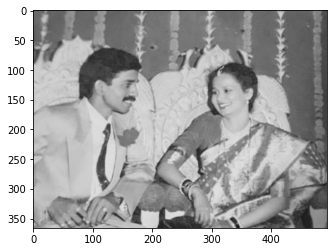

[[105.9552 104.9553 103.9446 ...  80.0241  77.7362  77.7362]
 [104.6672 104.9553 103.9554 ...  77.0244  73.7366  72.7367]
 [103.8953 103.8953 103.9554 ...  76.0245  72.7367  71.7368]
 ...
 [175.6683 160.8978 142.1277 ... 105.1808  97.8224  86.7957]
 [148.899  142.1277 133.7695 ...  98.1815  95.0615  86.7957]
 [135.9003 136.1283 135.8833 ...  94.0078  93.0617  86.0238]]


In [7]:
#attemot to use turn the oringnal image into grayscale before processing

img = np.asarray(Image.open(fname))
print(img.shape, rgb2gray(img).shape)
plt.imshow(rgb2gray(img), cmap=plt.get_cmap('gray'), vmin=0, vmax=255)
plt.show()
print(rgb2gray(img))

img_np = rgb2gray(img)
img_np = img_np[min(img_np.shape)-1][min(img_np.shape)-1]

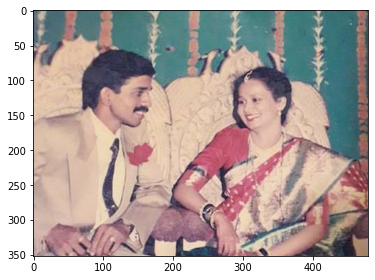

In [8]:

img_noisy_pil = crop_image(get_image(fname, imsize)[0], d=32)
img_noisy_np = pil_to_np(img_noisy_pil)
    
    # As we don't have ground truth
img_pil = img_noisy_pil
img_np = img_noisy_np
    
if PLOT:
  plot_image_grid([img_np], 4, 5);


# Setup

In [9]:
INPUT = 'noise' # 'meshgrid'
pad = 'reflection'
OPT_OVER = 'net' # 'net,input'

reg_noise_std = 1./30. # set to 1./20. for sigma=50
LR = 0.01

OPTIMIZER='adam' # 'LBFGS'
show_every = 100
exp_weight=0.99


num_iter = 2400
input_depth = 3
figsize = 5 
    
net = skip(
         input_depth, 3, 
         num_channels_down = [8, 16, 32, 64, 128], 
         num_channels_up   = [8, 16, 32, 64, 128],
         num_channels_skip = [0, 0, 0, 4, 4], 
         upsample_mode='bilinear',
         need_sigmoid=True, need_bias=True, pad=pad, act_fun='LeakyReLU')

net = net.type(dtype)
    
net_input = get_noise(input_depth, INPUT, (img_pil.size[1], img_pil.size[0])).type(dtype).detach()

# Compute number of parameters
s  = sum([np.prod(list(p.size())) for p in net.parameters()]); 
print (f'Number of params: {s}')

# Loss
mse = torch.nn.MSELoss().type(dtype)

img_noisy_torch = np_to_torch(img_noisy_np).type(dtype)

Number of params: 572827


# Optimize

Starting optimization with ADAM


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3635: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)


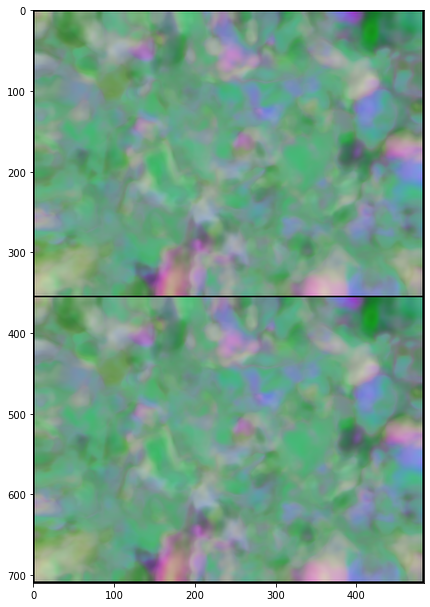

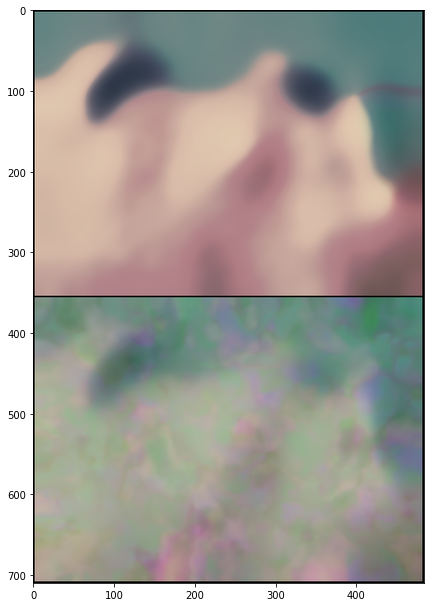

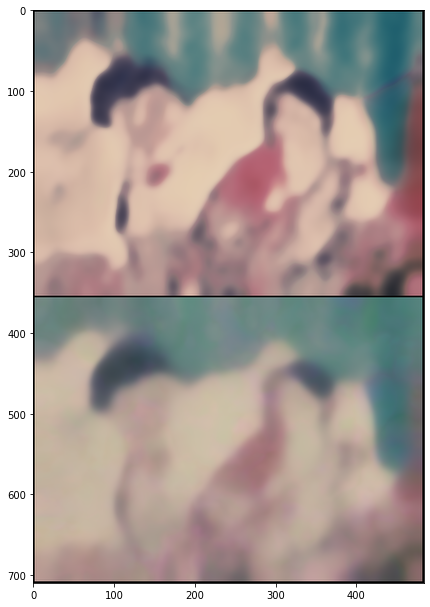

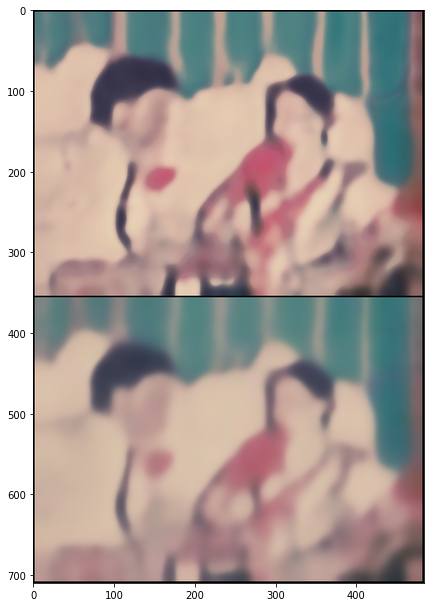

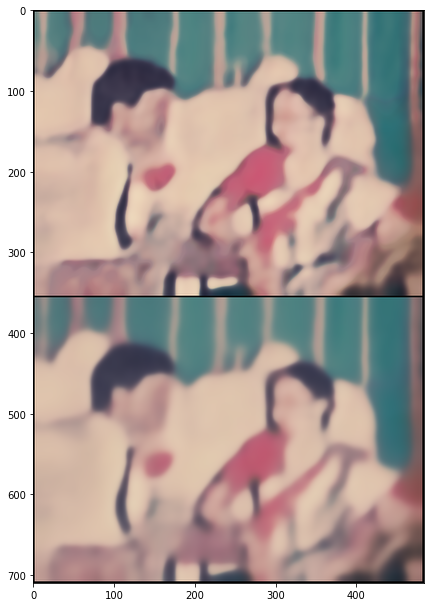

...

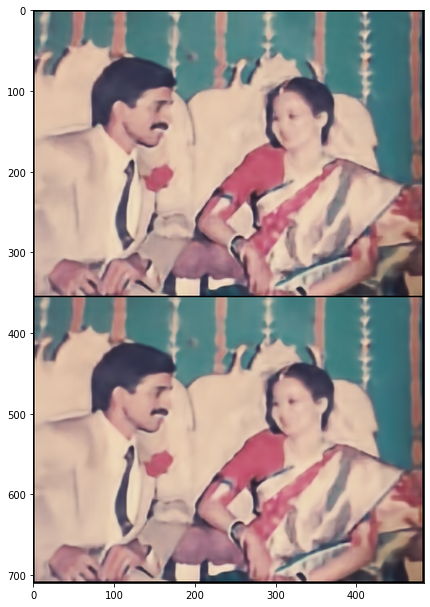

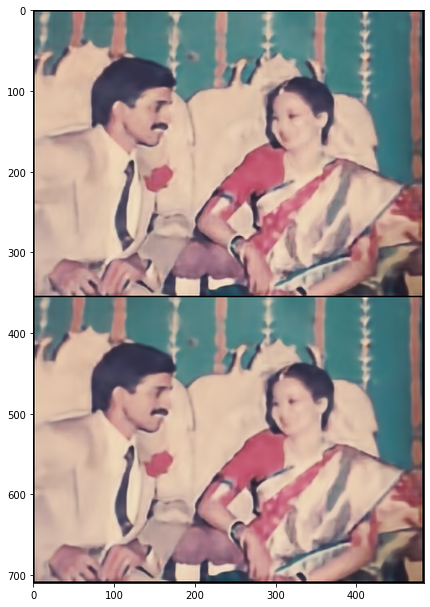

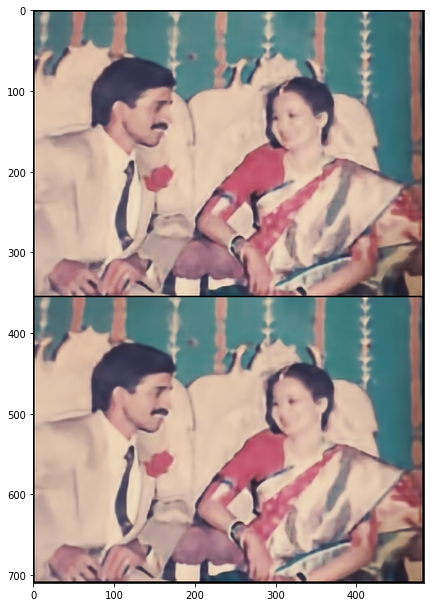

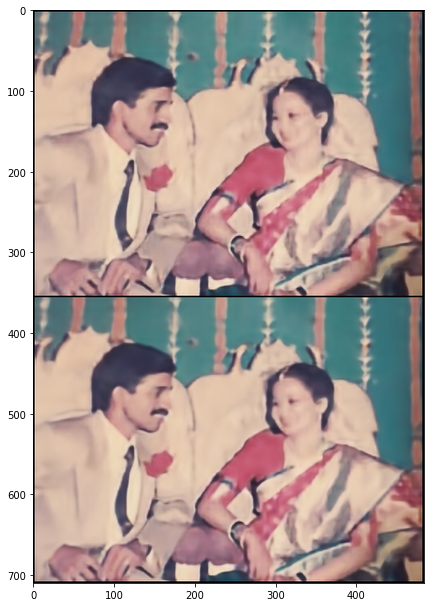

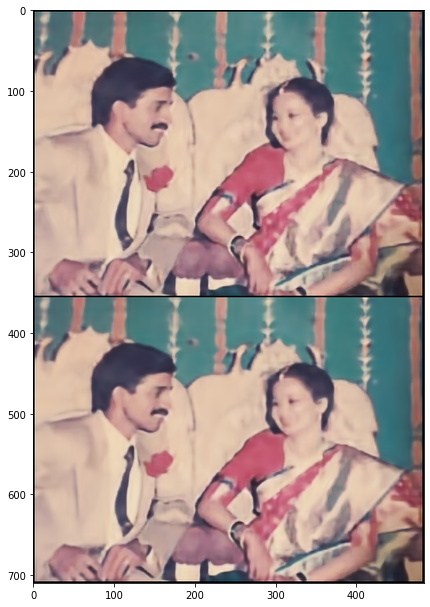

In [10]:
net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()
out_avg = None
last_net = None
psrn_noisy_last = 0

i = 0
plot_counter =0
def closure():
    
    global i, out_avg, psrn_noisy_last, last_net, net_input,plot_counter
    
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)
    
    out = net(net_input)
    
    # Smoothing
    if out_avg is None:
        out_avg = out.detach()
    else:
        out_avg = out_avg * exp_weight + out.detach() * (1 - exp_weight)
            
    total_loss = mse(out, img_noisy_torch)
    total_loss.backward()
        
    
    psrn_noisy = peak_signal_noise_ratio(img_noisy_np, out.detach().cpu().numpy()[0]) 
    psrn_gt    = peak_signal_noise_ratio(img_np, out.detach().cpu().numpy()[0]) 
    psrn_gt_sm = peak_signal_noise_ratio(img_np, out_avg.detach().cpu().numpy()[0]) 
    
    # Note that we do not have GT for the "snail" example
    # So 'PSRN_gt', 'PSNR_gt_sm' make no sense
    print (f'Iteration {i}    Loss {total_loss.item()}   PSNR_noisy: {psrn_noisy}   PSRN_gt: {psrn_gt} PSNR_gt_sm: {psrn_gt_sm} \r', end='')
    if  PLOT and i % show_every == 0:
        out_np = torch_to_np(out)
        plot_image_grid([np.clip(out_np, 0, 1), 
                         np.clip(torch_to_np(out_avg), 0, 1)], factor=figsize, nrow=1)
       
        out_avg_to_export=np.array([np.clip(torch_to_np(out_avg), 0, 1)]).squeeze()*255
        out_avg_to_export = np.transpose(out_avg_to_export, (1,2,0))
        cv2.imwrite(os.getcwd()+f'\\output\\'+'img_{plot_counter}.png', cv2.cvtColor(out_avg_to_export, cv2.COLOR_RGB2BGR))
        plot_counter+=1
        
    
    # Backtracking
    if i % show_every:
        if psrn_noisy - psrn_noisy_last < -5: 
            print('Falling back to previous checkpoint.')

            for new_param, net_param in zip(last_net, net.parameters()):
                net_param.data.copy_(new_param)

            return total_loss*0
        else:
            last_net = [x.detach().cpu() for x in net.parameters()]
            psrn_noisy_last = psrn_noisy
            
    i += 1

    return total_loss

p = get_params(OPT_OVER, net, net_input)
optimize(OPTIMIZER, p, closure, LR, num_iter)

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3635: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)


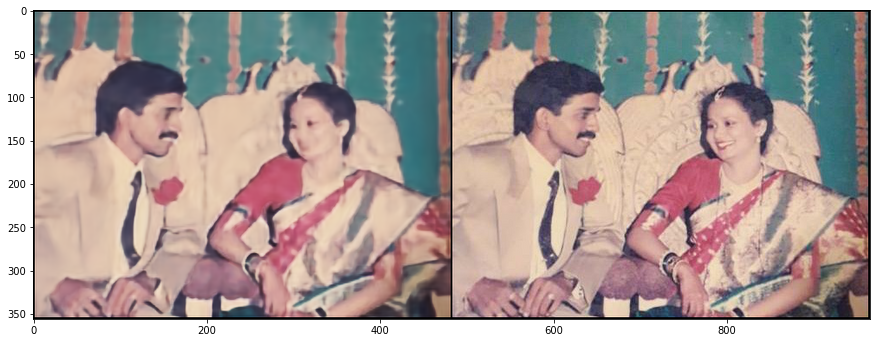

In [11]:
out_np = torch_to_np(net(net_input))
q = plot_image_grid([np.clip(out_np, 0, 1), img_np], factor=13);

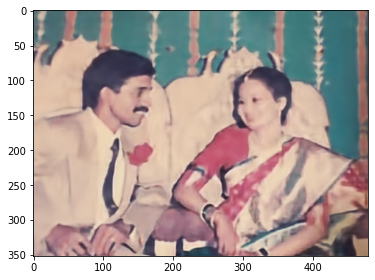

In [12]:
import torchvision
import torchvision.transforms as T

img = plot_image_grid([out_np], 4, 5);
tensors_to_plot = torch.from_numpy(img)
torchvision.utils.save_image(tensors_to_plot, 'test.png')
transform = T.ToPILImage()
img = transform(tensors_to_plot)


In [13]:
#Deblurring/ Deconvolution

import numpy as np
import matplotlib.pyplot as plt

from scipy.signal import convolve2d as conv2

from skimage import color, data, restoration


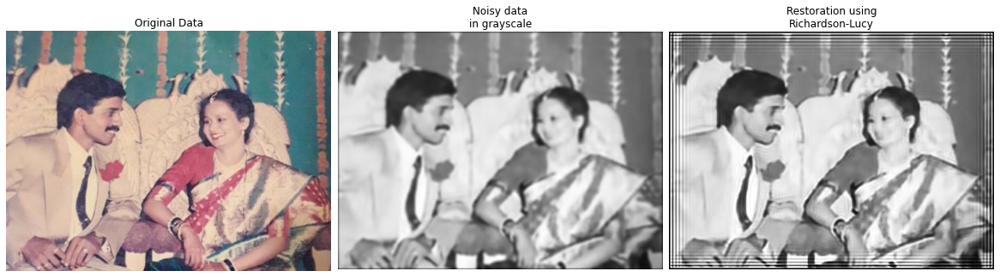

In [18]:
#importing image from the test

rng = np.random.default_rng()

image_orignal = np.asarray(Image.open(fname))
image = np.asarray(Image.open('test.png'))

image = color.rgb2gray(image)

psf = np.ones((5, 5)) / 25
image = conv2(image, psf, 'same')

deconvolved_RL = restoration.richardson_lucy(image, psf, 100)

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(16, 10))
plt.gray()

for a in (ax[0], ax[1], ax[2]):
       a.axis('off')

ax[0].imshow(image_orignal)
ax[0].set_title('Original Data')

ax[1].imshow(image)
ax[1].set_title('Noisy data\nin grayscale')

ax[2].imshow(deconvolved_RL, vmin=image.min(), vmax=image.max())
ax[2].set_title('Restoration using\nRichardson-Lucy')


fig.subplots_adjust(wspace=0.02, hspace=0.2,
                    top=0.9, bottom=0.05, left=0, right=1)
plt.show()

In [15]:
#attempt to use the image directly from the output

#converting to grayscale
img = color.rgb2gray(img)
psf = np.ones((5, 5)) / 25
img = conv2(img, psf, 'same')

deconvolved_RL = restoration.richardson_lucy(img, psf, 30)

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(8, 5))
plt.gray()

for a in (ax[0], ax[1], ax[2]):
       a.axis('off')

ax[0].imshow(img)
ax[0].set_title('Original Data')

ax[1].imshow(img)
ax[1].set_title('Noisy data')

ax[2].imshow(deconvolved_RL, vmin=img.min() - 1, vmax=img.max() - 1)
ax[2].set_title('Restoration using\nRichardson-Lucy')


fig.subplots_adjust(wspace=0.02, hspace=0.2,
                    top=0.9, bottom=0.05, left=0, right=1)
plt.show()


NameError: ignored